<a href="https://colab.research.google.com/github/JoshK68/Medical-Imaging_for_Retinal_Pathology_Detection/blob/main/Robotic_Pathology_Detection_for_Medical_Images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Explanation of the data set: The training data set contains 3435 retinal images that represent multiple pathological disorders. The patholgy classes and corresponding labels are: included in 'train.csv' file and each image can have more than one class category (multiple pathologies). The labels for each image are

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os

Mounted at /content/drive


In [ ]:
import pandas as pd    
labelled_data = pd.read_csv('/content/drive/MyDrive/Datasets/Medical_imaging/Data/Data/train/train.csv') 
labelled_data_n_g_dr = labelled_data.drop(columns =['opacity', 'macular edema', 'macular degeneration', 'retinal vascular occlusion'])
labelled_data_n_g_dr = labelled_data_n_g_dr[labelled_data_n_g_dr.iloc[:,1:].ne(0).any(axis=1)].reset_index(drop=True)

indices_to_drop = labelled_data_n_g_dr[(labelled_data_n_g_dr['diabetic retinopathy'] == 1) & (labelled_data_n_g_dr['glaucoma'] == 1)].index
print(f"The number of images that have both Glaucoma and Diabetic Retinopathy are {len(indices_to_drop)}, which is only {len(indices_to_drop) / labelled_data_n_g_dr.shape[0] * 100 :.2f}% of the dataset."
        " Therefore, we can safely drop those instances.")
labelled_data_n_g_dr.drop(indices_to_drop, inplace=True)
labelled_data_n_g_dr.head() 

The number of images that have both Glaucoma and Diabetic Retinopathy are 19, which is only 1.02% of the dataset. Therefore, we can safely drop those instances.


,filename,diabetic retinopathy,glaucoma,normal
0,3f58d128caf6.jpg,0,1,0
1,10ee8c8a72b4.jpg,1,0,0
2,3b6da0297f92.jpg,1,0,0
3,677c30357c4e.jpg,1,0,0
4,90ff4cbcdc9b.jpg,1,0,0


In [ ]:
TRAIN_DIR = '/content/drive/MyDrive/Datasets/Medical_imaging/Data/Data/train/train/'

In [ ]:
import cv2

# get the bgr img (defasult cv2 format) and flip it to rgb for viz purposes
def get_img(path):
  bgr_img = cv2.imread(path)
  b, g, r = cv2.split(bgr_img)
  rgb_img = cv2.merge([r, g, b])
  return rgb_img

Text(0, 0.5, 'D. R. Eye Images')

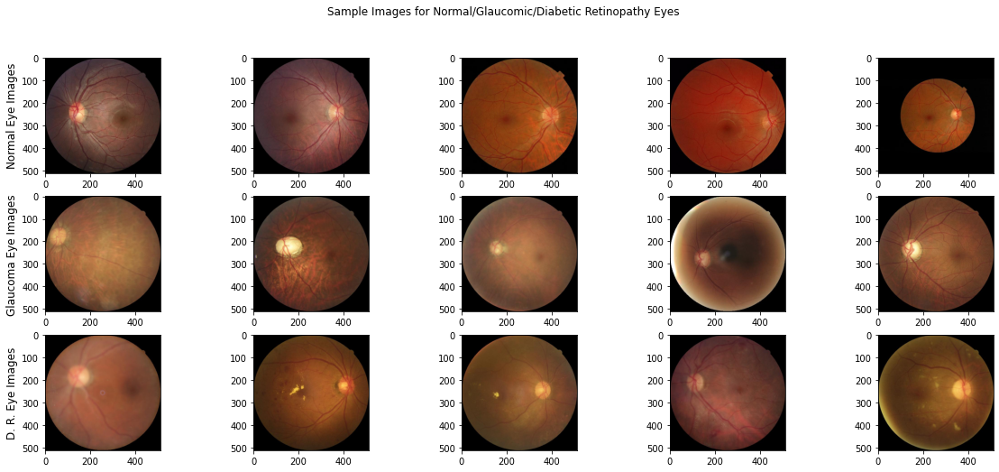

In [ ]:
from sklearn.utils import shuffle
import matplotlib.patches as patches
import matplotlib.pyplot as plt

shuffled_images = shuffle(labelled_data_n_g_dr, random_state = 30)

fig, ax = plt.subplots(3, 5, figsize = (20, 8))
fig.suptitle('Sample Images for Normal/Glaucomic/Diabetic Retinopathy Eyes')

#Normal
for i, idx in enumerate(shuffled_images[shuffled_images['normal'] == 1]['filename'][:5]):
  ax[0, i].imshow(get_img(TRAIN_DIR + idx))
ax[0,0].set_ylabel('Normal Eye Images', size='large')

#Glaucoma
for i, idx in enumerate(shuffled_images[shuffled_images['glaucoma'] == 1]['filename'][:5]):
  ax[1, i].imshow(get_img(TRAIN_DIR + idx))
ax[1,0].set_ylabel('Glaucoma Eye Images', size='large')

#Diabetic Retinopathy
for i, idx in enumerate(shuffled_images[shuffled_images['diabetic retinopathy'] == 1]['filename'][:5]):
  ax[2, i].imshow(get_img(TRAIN_DIR + idx))
ax[2,0].set_ylabel('D. R. Eye Images', size='large')

In [ ]:
num_samples_total = len(labelled_data_n_g_dr)
print(f"Total number of samples: {num_samples_total}")
for label in labelled_data_n_g_dr.columns[1:]:
  print(f"{labelled_data_n_g_dr[label].value_counts()[1] / num_samples_total * 100:.2f}% ({labelled_data_n_g_dr[label].value_counts()[1]}) of the samples are labelled with {label}")

Total number of samples: 1839
40.02% (736) of the samples are labelled with diabetic retinopathy
31.43% (578) of the samples are labelled with glaucoma
28.55% (525) of the samples are labelled with normal


In [ ]:
#As we can see, the dataset is not incredibly unbalanced between the various labels, though there is some unbalance.

**Hyper Parameter Selection**

There aren't a lot of hyperparameters to tune here, and for the most part I simply used default values.

I chose a decently high starting Learning Rate, and then scaled it by a factor of 10 for each patience interval, I believe this will help to ensure we hit our gradient!

In [ ]:
### SET HYPER PARAMETERS
EPOCHS = 100
BATCH_SIZE = 64
IMG_SIZE = 256
NUM_CLASSES = len(labelled_data_n_g_dr.columns[1:])

LR = 0.001
LR_PATIENCE = 5 
LR_SCHEDULE = 0.1

In [ ]:
from tensorflow.keras.preprocessing import image
def return_im_array(filepath):
  img = image.load_img(filepath, target_size=(IMG_SIZE, IMG_SIZE, 3))
  img = image.img_to_array(img)
  return img

In [ ]:
from tqdm import tqdm
import numpy as np

X = [None] * labelled_data_n_g_dr.shape[0]
for i, row in tqdm(enumerate(labelled_data_n_g_dr.itertuples(index=False))):
  X[i] = return_im_array(TRAIN_DIR + row[0])

X = np.array(X)

1839it [08:19,  3.68it/s]


In [ ]:
#Here, I simply output the labels from the dataframe to a label vector!

In [ ]:
y = labelled_data_n_g_dr[['normal', 'glaucoma', 'diabetic retinopathy']].values

**Preparing the Data for Training**

Next up, we split our dataset into training and validation datasets, ensuring to stratify across y to ensure balanced training/validation sets.

The first split is for 30% holdout data, the model will never use this to train to try and get the most accurate measure of the model performance after training.

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 30, stratify=y)

Then we split it into a training/validation set using the same ratio

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.3, random_state = 30, stratify=y_train)

In [ ]:
print(f'Holdout Test Samples: {X_test.shape[0]}\nTraining Set Samples: {X_train.shape[0]}\nValidation Set Samples: {X_valid.shape[0]}')

Holdout Test Samples: 552
Training Set Samples: 900
Validation Set Samples: 387


In [ ]:
import tensorflow as tf
import tensorflow.keras as keras

**Here we create our data augmentation image_datagen.**

We enable hortizontal/vertical flip because as you can see in the provided samples, the eyes appear in all sorts of configurations, so we really want to make sure we're training each batch on the widest number of samples to prevent overfitting/increasing how generlizable the model is to various eye shapes/types.

In [ ]:
image_datagen = keras.preprocessing.image.ImageDataGenerator(rotation_range=0.2,
                                                             width_shift_range = 0.1,
                                                             height_shift_range = 0.1,
                                                             zoom_range = 0.2,
                                                             brightness_range=(0.8, 1.2),
                                                             fill_mode = 'nearest',
                                                             horizontal_flip = True,
                                                             vertical_flip = True)

In [ ]:
train_datagen = image_datagen.flow(X_train,
                                   y_train,
                                   batch_size=BATCH_SIZE,
                                   shuffle=True)

In [ ]:
valid_datagen = image_datagen.flow(X_valid,
                                   y_valid,
                                   batch_size=BATCH_SIZE,
                                   shuffle=False)

 this is a function that helps implement an f1 score, as Keras removed their metrics from their API.

In [ ]:
import tensorflow.keras.backend as K

In [ ]:
def f1(y_true, y_pred):
      def recall(y_true, y_pred):
        """Recall metric.

        Only computes a batch-wise average of recall.

        Computes the recall, a metric for multi-label classification of
        how many relevant items are selected.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

      def precision(y_true, y_pred):
        """Precision metric.

        Only computes a batch-wise average of precision.

        Computes the precision, a metric for multi-label classification of
        how many selected items are relevant.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

      precision = precision(y_true, y_pred)
      recall = recall(y_true, y_pred)
      return 2*((precision*recall)/(precision+recall+K.epsilon()))

**Preparing our Model and Training**

Creating our callbacks!

The most important one is the learning_rate_schedule, which will decrease the learning rate after a certain number of epochs with no improvement to try and make sure we're constantly training instead of straddling a minima!

Otherwise, we use a standard checkpoint callback to grab the best model!

In [ ]:
learning_rate_schedule = keras.callbacks.ReduceLROnPlateau(monitor='val_f1', factor=LR_SCHEDULE, mode='max', patience=LR_PATIENCE, min_lr=1e-8, verbose=1)
model_checkpoints = keras.callbacks.ModelCheckpoint('resnet50v2.h5', monitor='val_f1', save_best_only=True, save_weights_only=True, mode='max', verbose=1)
callbacks = [learning_rate_schedule, model_checkpoints]

In [ ]:
input = tf.keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
base_model = keras.applications.ResNet50V2(include_top=False, weights='imagenet', input_tensor = input)
base_model.trainable = True

gmap = keras.layers.GlobalMaxPooling2D()(base_model.output)
output = keras.layers.Dense(NUM_CLASSES, activation='sigmoid')(gmap)

model = tf.keras.Model(base_model.input, output)

94683136/94668760 [==============================] - 1s 0us/step


In [ ]:
#Boilerplate for training a model. We're using categorical_crossentropy as this is a multi-class classifier.

In [ ]:
STEPS_PER_EPOCH = train_datagen.n // BATCH_SIZE
VALIDATION_STEPS = valid_datagen.n // BATCH_SIZE

model.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), loss='categorical_crossentropy', metrics=[f1])

history = model.fit(train_datagen,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    epochs=EPOCHS,
                    validation_data=valid_datagen,
                    validation_steps=VALIDATION_STEPS,
                    callbacks=callbacks)

Epoch 1/100
14/14 [==============================] - ETA: 0s - loss: 5.9075 - f1: 0.5711
Epoch 00001: val_f1 improved from -inf to 0.45486, saving model to resnet50v2.h5
14/14 [==============================] - 35s 2s/step - loss: 5.9075 - f1: 0.5711 - val_loss: 10087.3018 - val_f1: 0.4549 - lr: 0.0010
Epoch 2/100
14/14 [==============================] - ETA: 0s - loss: 1.7906 - f1: 0.5018
Epoch 00002: val_f1 improved from 0.45486 to 0.47569, saving model to resnet50v2.h5
14/14 [==============================] - 23s 2s/step - loss: 1.7906 - f1: 0.5018 - val_loss: 18545540.0000 - val_f1: 0.4757 - lr: 0.0010
Epoch 3/100
14/14 [==============================] - ETA: 0s - loss: 1.3575 - f1: 0.4898
Epoch 00003: val_f1 did not improve from 0.47569
14/14 [==============================] - 26s 2s/step - loss: 1.3575 - f1: 0.4898 - val_loss: 102586.9375 - val_f1: 0.4704 - lr: 0.0010
Epoch 4/100
14/14 [==============================] - ETA: 0s - loss: 1.0782 - f1: 0.4808
Epoch 00004: val_f1 did 

In [ ]:
#Loading the best weights from our run:

In [ ]:
model.load_weights('resnet50v2.h5')

**Predictions, and Scoring**

Helper function for converting our predicted probabilties back to readable labels.

I added the ability to output the max predicted values for visualization later.

In [ ]:
def convert_pred(preds, inc_max=False):
  new_preds = np.zeros(preds.shape)
  for idx, row in enumerate(preds):
    new_preds[idx][np.argmax(row)] = 1
  
  max_arr = np.argmax(preds, axis=0)
  if inc_max:
    return new_preds, max_arr
  else: return new_preds

Here we grab the labels that our model predicts!

In [ ]:
y_pred_fixed, max_in_class = convert_pred(model.predict(X_test), inc_max = True)

y_pred = y_pred_fixed.astype(np.float64)
y_test = y_test.astype(np.float64)

Helper function for scoring the model based on a number of metrics in order of what I believe is the importance!

In [ ]:
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score

def score_model(y_true, y_pred):
  print(f"Model F1:     {f1_score(y_true, y_pred, average='macro') * 100:.2f}%")
  print(f"Model Recall: {recall_score(y_true, y_pred, average='macro') * 100:.2f}%")
  print(f"Model Prec:   {precision_score(y_true, y_pred, average='macro') * 100:.2f}%")
  print(f"Model Acc:    {accuracy_score(y_true, y_pred) * 100:.2f}%")

In [ ]:
score_model(y_test, y_pred)

Model F1:     72.13%
Model Recall: 71.35%
Model Prec:   75.40%
Model Acc:    70.83%


Overall this model did very well, it actually outperformed the validation scores very slightly, which indicates that the testing dataset is "easier" in some ways than the validation set. This is likely due to the splitting of data that I used, but due to time constraints (and a perfomative model) I am content to leave this as a exercise for the future.

Training/Validation Curves
Here we see the training/validation loss/f1 curves and notice there appears to be little to no overfitting!

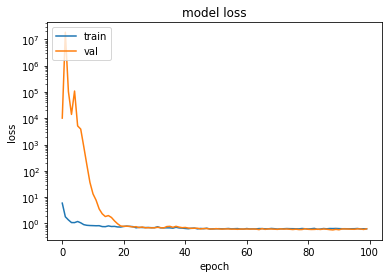

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.yscale('log')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

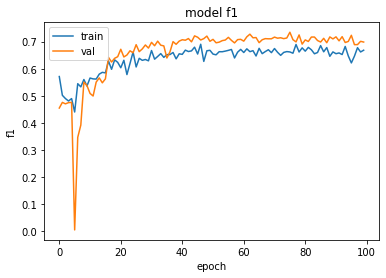

In [ ]:
plt.plot(history.history['f1'])
plt.plot(history.history['val_f1'])
plt.title('model f1')
plt.ylabel('f1')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In this part, we'll take advantage of some fantastic resources to build some functions that will help us visualize what the model is "seeing" or paying attention to!

**Saliency Heatmaps**

Here we can take advantage of the max predicted values we collected earlier in order to see how the model sees things it confidently believes to be members of each class!

In [ ]:
im_normal, im_glau, im_diab = X_test[max_in_class]

The following helper function essentially creates a grid of heatvalues based on the last convolution layer, and then merges the heatmap with the original images. It allows us to see areas of importance in each class!

In [ ]:
from keras.applications.resnet_v2 import preprocess_input
from google.colab.patches import cv2_imshow

def gradCAM(orig, intensity=0.5, res=250):
  x = np.expand_dims(orig, axis=0)

  preds = convert_pred(model.predict(x)) # prints the class of image

  with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer('conv5_block3_3_conv')
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(x)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
      
  heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)
  heatmap = np.maximum(heatmap, 0)
  heatmap /= np.max(heatmap)
  heatmap = heatmap.reshape((8, 8))

  orig_rbg = cv2.cvtColor(orig,cv2.COLOR_BGR2RGB)
  image_rgb = cv2.cvtColor(orig,cv2.COLOR_BGR2RGB)

  heatmap = cv2.resize(heatmap, (256, 256))

  heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)

  image_rgb = heatmap * intensity + image_rgb

  cv2_imshow(cv2.resize(orig_rbg, (res, res)))
  cv2_imshow(cv2.resize(image_rgb, (res, res)))


Normal Eye

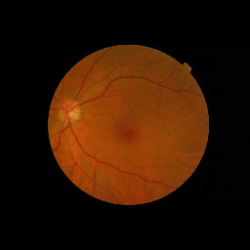

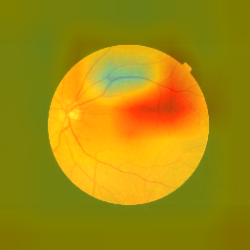

In [ ]:
gradCAM(im_normal)

The normal image appears to be looking all over with a relatively wide region of attention. This leads me to believe that the model has learned that these regions being the way they are implies health - which is in line with the resources I've examined!

The fact that it's looking near the optical nerve/macular and at the vessels/searching for "cotton wool spots" leads me to believe it mostly understands what a healthy eye is!

Eye with Glaucoma

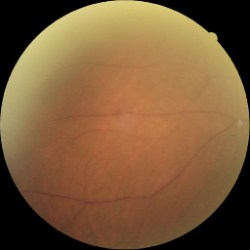

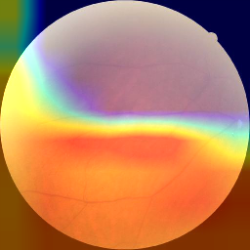

In [ ]:
gradCAM(im_glau)

We observe here that for the glaucoma image, the model is mostly paying attention to the area around the optical nerve.

As we can see in the reference image, this is in line with what we might expect, where the model has effectively learned where the important area of the eye is for diagnosing glaucoma!

Diabetic Retinopathy

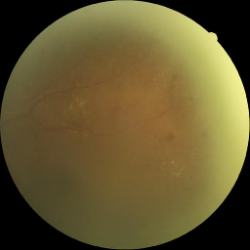

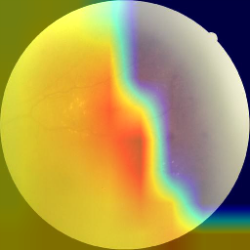

In [ ]:
gradCAM(im_diab)

Another promising result! It appears that the model is "honing in" on the expected features: the optical nerve, the retinal blood vessels, and those horrifying "cotton wool"! This is very cool.

The above images lead me to believe fairly strongly that the model is actually learning where to look, and what features are correlated with which diagnosis! Very cool!

Feature Maps
Here we get to look at how the model processes each image, and how the convolutions progress through the many convolutional layers in the ResNet50v2 model!

In [ ]:
feature_model = tf.keras.Model(base_model.input, output)
feature_model.load_weights('resnet50v2.h5')
conv_layers = []

for i, layer in enumerate(feature_model.layers):
  if layer.name[-4:] == 'conv':
    conv_layers.append(i)

In [ ]:
outputs = [feature_model.layers[i].output for i in conv_layers]
feature_model = tf.keras.Model(inputs=feature_model.inputs, outputs=outputs)

im_normal, im_glau, im_diab = X_test[max_in_class]

def show_features(base_image):
  # convert the image to an array
  img = base_image
  # expand dimensions so that it represents a single 'sample'
  img = np.expand_dims(img, axis=0)
  print(img.shape)
  # get feature map for first hidden layer
  feature_maps = feature_model.predict(img)
  # plot the output from each block
  square = 8
  for fmap in feature_maps:
    # plot all 64 maps in an 8x8 squares
    ix = 1
    for _ in range(square):
      for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(fmap[0, :, :, ix-1], cmap='gray')
        ix += 1
    # show the figure
    plt.show()


Normal Features

(1, 256, 256, 3)


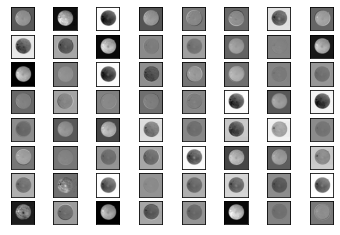

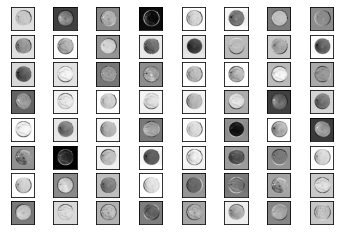

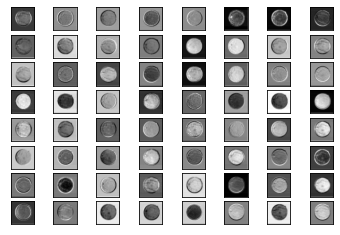

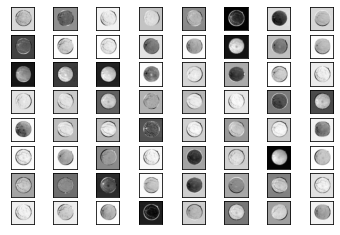

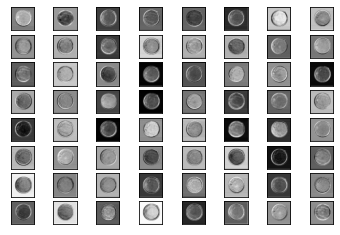

...

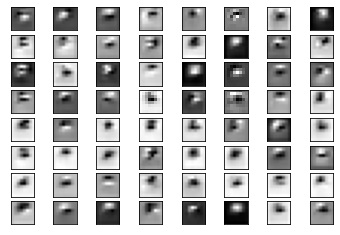

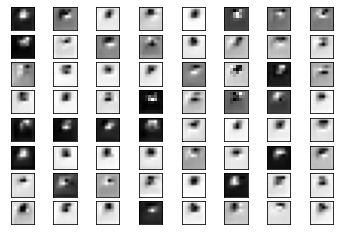

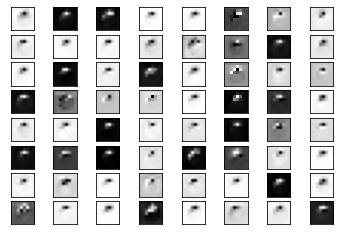

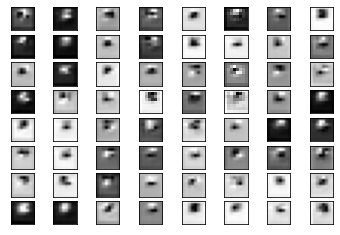

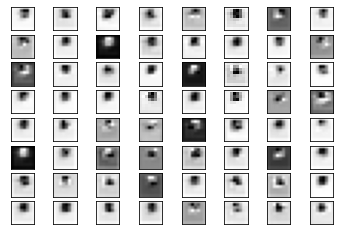

In [ ]:
show_features(im_normal)

Glaucoma Features

(1, 256, 256, 3)


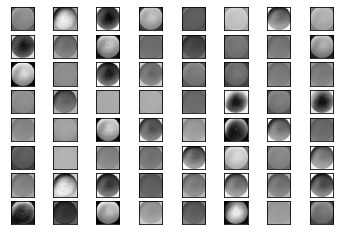

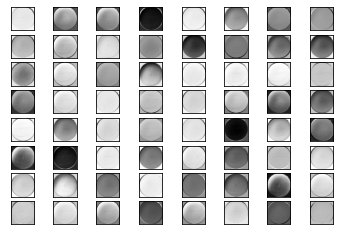

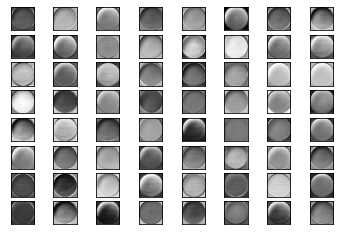

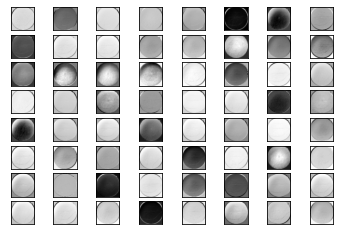

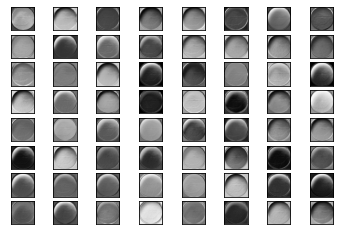

...

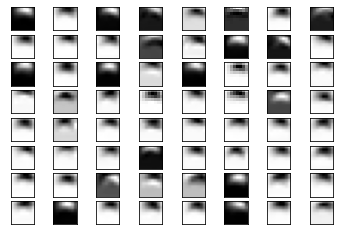

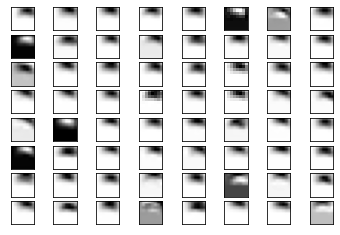

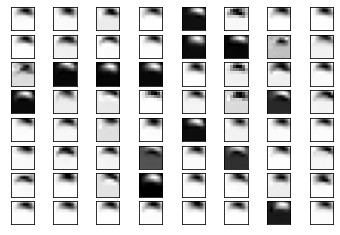

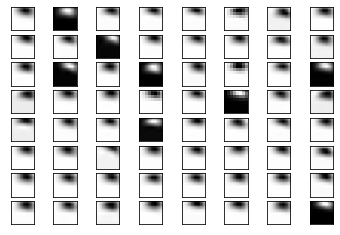

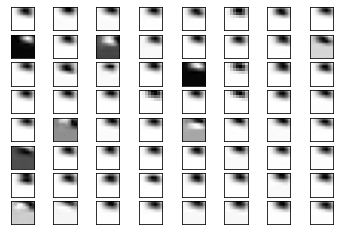

In [ ]:
show_features(im_glau)

Diabetic Retinopathy

(1, 256, 256, 3)


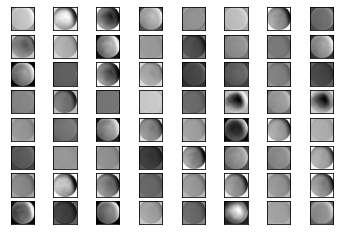

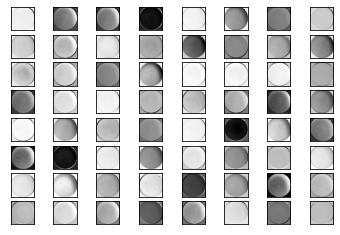

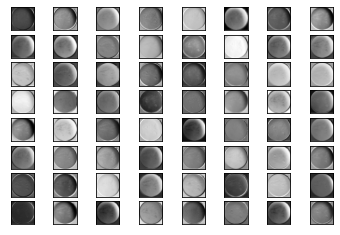

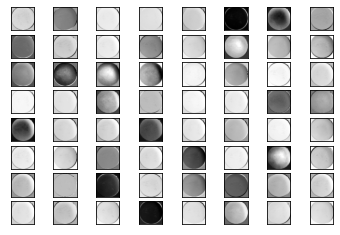

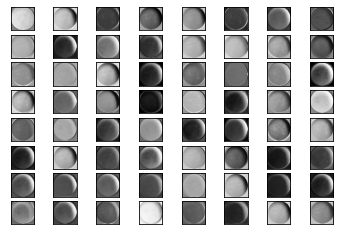

...

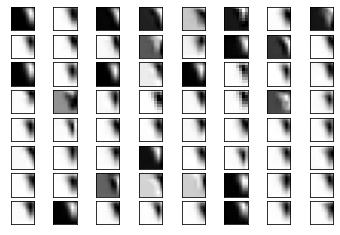

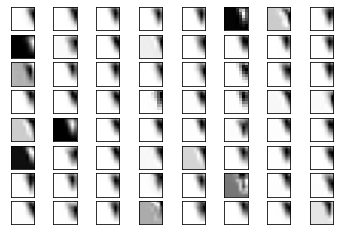

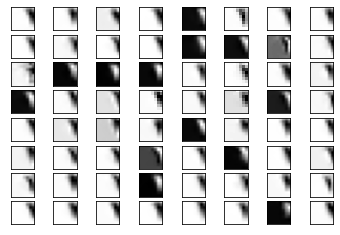

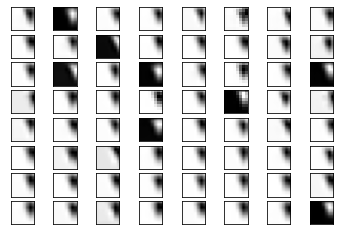

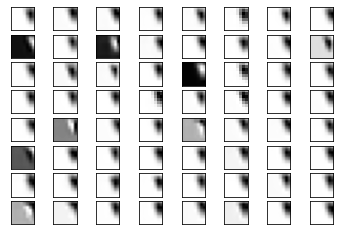

In [ ]:
show_features(im_diab)

In this part we use self-training (with confidence) to label our unlabelled test set, and retrain the model on the augmented dataset.

In [ ]:
TEST_DIR = '/content/drive/MyDrive/Datasets/Medical_imaging/Data/Data/test/test/'
unlabelled_list = os.listdir(TEST_DIR)

X_unlabelled = [None] * len(unlabelled_list)
for i in tqdm(range(len(unlabelled_list))):
  X_unlabelled[i] = return_im_array(TEST_DIR + unlabelled_list[i])

X_unlabelled = np.array(X_unlabelled)

100%|██████████| 350/350 [00:07<00:00, 48.03it/s]


Below we simply extract the last "dense" layer before classification, which happens to be the global pooling layer we added to the ResNet50v2 model!

In [ ]:
layer_name = 'global_average_pooling2d_3'
layer_output = model.get_layer(layer_name).output

ValueError: ignored

Next we predict each label, and if it meets a certain confidence threshold (0.9 was selected as a reasonable seeming option) we include it in the dataset we will use to augment our original training data.

In [ ]:
CONFIDENCE = 0.9
Y_ul = list()
X_ul = list()
for i in tqdm(range(np.shape(X_unlabelled)[0])):
    img=X_unlabelled[i]
    img = np.expand_dims(img,axis=0)
    potential_label = model.predict(img)
    highest_index = np.argmax(potential_label)
    if potential_label[0][highest_index] > CONFIDENCE:
      label = convert_pred(potential_label)
      Y_ul.append(label)
      X_ul.append(img)

100%|██████████| 350/350 [00:18<00:00, 19.39it/s]


**Reshaping and Squeezing**

We need to ensure that the format of the newly generated arrays are compatible with the existing training data!

We were able to predict !!251!! examples with 90% confidence! That's great!

In [ ]:
eY_ul = np.array(Y_ul)
Y_ul = np.squeeze(Y_ul)
Y_ul.shape

(62, 3)

In [ ]:
X_ul = np.array(X_ul)
X_ul = np.squeeze(X_ul)
X_ul.shape

(62, 256, 256, 3)

Concatenating the augmented dataset with the training set for a augmented total dataset which will hopefully help us seek out a bit more performance from our model!

In [ ]:
X_train_full = np.concatenate((X_train, X_ul), axis=0)
y_train_full = np.concatenate((y_train, Y_ul), axis=0)

**Model Building, Compiling, and Fitting**

Retraining the model on the new dataset, making sure to create a new datagen for it so we can perform similar image augmentation as we did on the original dataset!

In [ ]:
full_train_datagen = image_datagen.flow(X_train_full,
                                        y_train_full,
                                        batch_size=BATCH_SIZE,
                                        shuffle=True)

learning_rate_schedule = keras.callbacks.ReduceLROnPlateau(monitor='val_f1', factor=LR_SCHEDULE, mode='max', patience=LR_PATIENCE, min_lr=1e-8, verbose=1)
model_checkpoints = keras.callbacks.ModelCheckpoint('resnet50v2_aug_with_conf.h5', monitor='val_f1', save_best_only=True, save_weights_only=True, mode='max', verbose=1)
callbacks = [learning_rate_schedule, model_checkpoints]

STEPS_PER_EPOCH = full_train_datagen.n // BATCH_SIZE
VALIDATION_STEPS = valid_datagen.n // BATCH_SIZE

input = tf.keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
base_model = keras.applications.ResNet50V2(include_top=False, weights='imagenet', input_tensor = input)
base_model.trainable = True

gmap = keras.layers.GlobalAveragePooling2D()(base_model.output)
output = keras.layers.Dense(NUM_CLASSES, activation='sigmoid')(gmap)

aug_model = tf.keras.Model(base_model.input, output)

aug_model.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), loss='categorical_crossentropy', metrics=[f1])

aug_history = aug_model.fit(full_train_datagen,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    epochs=EPOCHS,
                    validation_data=valid_datagen,
                    validation_steps=VALIDATION_STEPS,
                    callbacks=callbacks)

Epoch 1/100
15/15 [==============================] - ETA: 0s - loss: 0.9174 - f1: 0.6110
Epoch 00001: val_f1 improved from -inf to 0.28646, saving model to resnet50v2_aug_with_conf.h5
15/15 [==============================] - 30s 2s/step - loss: 0.9174 - f1: 0.6110 - val_loss: 3647.2048 - val_f1: 0.2865 - lr: 0.0010
Epoch 2/100
15/15 [==============================] - ETA: 0s - loss: 0.7125 - f1: 0.6876
Epoch 00002: val_f1 improved from 0.28646 to 0.39262, saving model to resnet50v2_aug_with_conf.h5
15/15 [==============================] - 22s 1s/step - loss: 0.7125 - f1: 0.6876 - val_loss: 214.1188 - val_f1: 0.3926 - lr: 0.0010
Epoch 3/100
15/15 [==============================] - ETA: 0s - loss: 0.7578 - f1: 0.6250
Epoch 00003: val_f1 improved from 0.39262 to 0.45486, saving model to resnet50v2_aug_with_conf.h5
15/15 [==============================] - 22s 1s/step - loss: 0.7578 - f1: 0.6250 - val_loss: 30.7692 - val_f1: 0.4549 - lr: 0.0010
Epoch 4/100
15/15 [===========================

Plotting Training/Validation Curves

Let's see how those loss/f1 curves look!

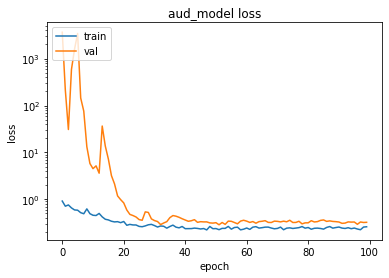

In [ ]:
plt.plot(aug_history.history['loss'])
plt.plot(aug_history.history['val_loss'])
plt.title('aud_model loss')
plt.ylabel('loss')
plt.yscale('log')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

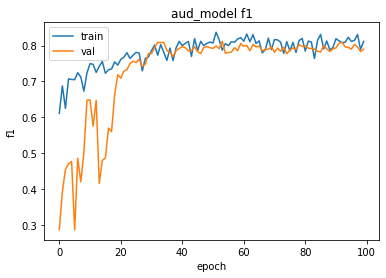

In [ ]:
plt.plot(aug_history.history['f1'])
plt.plot(aug_history.history['val_f1'])
plt.title('aud_model f1')
plt.ylabel('f1')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
#Nothing too unusual here, maybe some slight overfitting but it seems more like a disparity rather than overfitting as both level off instead of diverging!

In [ ]:
y_pred_fixed_full, max_in_class = convert_pred(aug_model.predict(X_test), inc_max = True)

y_pred_full = y_pred_fixed_full.astype(np.float64)
y_test = y_test.astype(np.float64)
score_model(y_test, y_pred_full)

Model F1:     86.80%
Model Recall: 87.29%
Model Prec:   86.54%
Model Acc:    86.78%


In [ ]:
###This, to me, indicates a rather large success! Not only was the model predicting (likely) accurate labels, but since the model trained on the augmented data and got a higher test score, that very much implies to me that the self-training was a big success! While 2% isn't much to write home about, it is better and that by itself to me is a little mindblowing!

In [ ]:
#Below we can see a comparison between the unaugmented dataset (no self-training) and the training set augmented with self-training:

#Model	F1	Recall	Precision	Acc

#Training Images Only	88.67%	88.86%	88.51%	88.59%
#Augmented Training Set	90.41%	90.57%	90.29%	90.22%

#As you can see, there is a clear performance increase using the augmented training set across the board!